# Project: Data Analysis of COVID19 Data
## by Daniel Leirer

## Table of Contents

<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#set&lib">Settings and Libraries</a></li>
<li><a href="#clean">Clean Data</a></li>
<li><a href="#vis">Plot Data</a></li>
<li><a href="#output">Save Plots</a></li>
</ul>

<a id='intro'></a>

## Introduction
This is an analysis of the COVID19 data. 

I was interested in just creating some dynamic visualisations, for exploring relationships.
I really admire Hans Rosling and the gapminder foundation (https://www.gapminder.org/), and I have often wanted a tool to explore covid data in the gapminder way. 
I decided to work towards utilizing "plotly" and "dash" to build a flexible dashboard in the spirit of gapminder to explore relationships. 

Todo list:
1. Add Dahs : Instead of Dash I currently just output the plotly graphs to an html file. 
2. Add custom buttons to plotly plots to allow users to change x and y axis variables. 


### Data Sources:

#### COVID19 cases worldwide: 
link = https://data.europa.eu/euodp/en/data/dataset/covid-19-coronavirus-data (accessed on 27/06/2020)

#### Worldbank Data 
Link = https://data.worldbank.org/indicator/SP.URB.TOTL.IN.ZS?most_recent_year_desc=true (accessed via "wbdata" package)




In [22]:
#!pip install -U wbdata

<a id="set&lib"></a>
    
## Settings & Libraries:


### Import Packages


In [2]:
import os
import datetime 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px

#For accessing worldbank data
import wbdata


## set sns basecolor
base_color = sns.color_palette()[0]

#magic for matplotlib
%matplotlib inline


#define data directory
data_dir = "data"


### Get Covid19 data
Read CSV data.

In [3]:

#Paths to files
COVID19_Path = os.path.join(data_dir,"Covid19_worldwide.csv")
#POP_DENSITY_path = os.path.join(data_dir,"population_density_per_square_km.csv")


#Load Data
df_covid19 = pd.read_csv(COVID19_Path, sep=",")
#df_density = pd.read_csv(POP_DENSITY_path, sep=",")




In [4]:
#Get data from worldbank 
#dictionary of indicators
indicators = {"EN.POP.DNST":"population_density_per_sqkm",
              "SH.MED.BEDS.ZS":"hospital_beds_per_1k",
              "SH.MED.PHYS.ZS":"Physicians_per_1k",
              "SH.STA.OWAD.ZS":"Overweight_percent",
              "SP.RUR.TOTL.ZS":"Rural_population_percent",
              "SP.URB.TOTL.IN.ZS":"Urban_population_percent",
              "EN.POP.SLUM.UR.ZS":"Slums_population_percent",  
              "SP.POP.65UP.TO.ZS":"population_65_up_percent"}


date_range = datetime.datetime(2010, 1, 1), datetime.datetime(2020, 1, 1)  

df_worldbank = wbdata.get_dataframe(indicators, country='all', data_date=date_range, freq='Y', source=None, convert_date=False, keep_levels=False, cache=True)

#groupby & select last avaulable value
df_worldbank = df_worldbank.groupby("country").last()
df_worldbank.reset_index(inplace=True)

#replace spaces in country column with underscores. 
df_worldbank.country.to_list()
df_worldbank["country"]=df_worldbank.country.replace(' ', '_', regex=True)


<a id="clean"></a>
## Clean Data

1.   Add unique id as index
2.   Change dateRep to datetime
3.   Remove unused columns
4.   Sort by date.


In [5]:

#df_covid19.describe()
#df_covid19.info()
#df_covid19.head()

In [6]:

#Load Data
df_covid19 = pd.read_csv(COVID19_Path, sep=",")

#change_colnames
df_covid19.columns = ['date', 'day', 'month', 'year', 'cases', 'deaths','countries', 'geoId', 'country_code','population', 'continent']

#create unique id 
df_covid19["ID"] = df_covid19["date"]  + "_" + df_covid19["countries"]
df_covid19.set_index("ID",inplace = True)



# Change datatypes
df_covid19["date"] = pd.to_datetime(df_covid19[["year","month","day"]])

#sort by date and country
df_covid19=df_covid19.sort_values(["year","month","day"],ascending = True)



In [7]:
#function to help fill dates. This should be rewritten if there is time. 
def fill_dates(input_df,variable_feature,fill_value = 0):
    '''
    input = dataframe with columns ["date","countries",variable]
    output = dataframe with missing dates added for each country and filled with fill_value
    '''

    df_temp=input_df[[variable_feature,"countries","date"]]
    df_temp=df_temp.set_index("date")
    
    df_temp=df_temp.pivot(columns="countries").fillna(fill_value)
    df_temp=df_temp.reset_index().melt(id_vars=["date"],value_name=variable_feature)
    
    #drop none column
    df_temp=df_temp[["date","countries",variable_feature]]
    
    return df_temp

df_deaths = fill_dates(input_df = df_covid19 ,variable_feature = "deaths",fill_value=0)
df_cases = fill_dates(input_df = df_covid19 ,variable_feature = "cases",fill_value=0)

df_cases["deaths"] = df_deaths["deaths"]

df_covid19_full=df_cases.merge(df_covid19[['countries', 'geoId', 'country_code','population', 'continent']].groupby("countries").last(),how="inner",on="countries")


### Create Features:


1.   Adjust cases and deaths by million population.
2.   Get Cumsum.
3.   Get 7 Day rolling average. 

In [8]:
#get death per million
df_covid19_full["deaths_ppm"] = df_covid19_full["deaths"] / df_covid19_full["population"] * 10**6
df_covid19_full["cases_ppm"] = df_covid19_full["cases"] / df_covid19_full["population"] * 10**6

#get cumulative deaths. 
df_covid19_full[["deaths_cumsum","deaths_ppm_cumsum","cases_cumsum","cases_ppm_cumsum"]] =df_covid19_full.groupby("countries")[["deaths","deaths_ppm","cases","cases_ppm"]].cumsum(axis=0)


<a id="vis"></a>
## Plot Data


In [9]:
df_plot = df_covid19_full.dropna()
df_plot["date"] = df_plot["date"].dt.strftime("%Y-%m-%d")
df_plot = df_plot[df_plot["date"] > "2020-03-01"]

max_x = df_plot["cases_ppm_cumsum"].max()
max_y = df_plot["deaths_ppm_cumsum"].max()


<ipython-input-9-f6448ed6f9b1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_plot["date"] = df_plot["date"].dt.strftime("%Y-%m-%d")


In [10]:
fig = px.scatter(df_plot, x="cases_ppm_cumsum", y="deaths_ppm_cumsum", animation_frame="date", animation_group="countries",
           size="population", color="continent", hover_name="countries",
           log_x=True, log_y = True, size_max=55,range_x=[1,max_x],range_y=[1,max_y],
           title="Coronavirus Deaths vs Cases adjusted for population",
           labels={"cases_ppm_cumsum": "Cases per million",  "deaths_ppm_cumsum": "Deaths per million",  "continent": "Continent"}
           )
fig.show()

In [11]:
fig_world = px.scatter_geo(df_plot, locations="country_code", color="continent", hover_name="countries", size="cases_ppm_cumsum",
           animation_frame="date", projection="natural earth",
           title="Coronavirus Case adjusted for population",
           labels={"cases_ppm_cumsum":"Cases per million", "deaths_ppm_cumsum":"Deaths per million", "continent":"Continent"})
fig_world.show()

In [12]:
#add 7 day simple moving average.
df_covid19_full["deaths_ppm_sma_7"] = df_covid19_full.groupby("countries")["deaths_ppm"].rolling(window=7).mean().values

#get date where 7 day moving average for each country was highest. 
#This corresponds to the peak in a curve of daily deahts. 
#After this point daily death rates slowly decrease in the absence of major events such as policy changes regarding lockdowns.   
#We can then use previously calculated cumulative deaths to compare countries at a similair stage of the outbreak.
#This essentially captures the upward trend of the data, and should ensure that we are looking at the same phase of the disease. 

#get the id for max deaths.
death_peak_id = df_covid19_full.groupby("countries")["deaths_ppm_sma_7"].transform(max) == df_covid19_full["deaths_ppm_sma_7"]

#death_peak_id to subset to date where 7day moving average peaked for each country.
df_covid19_peak=df_covid19_full[death_peak_id]


#subset to 
#1: countries in europe 
#2: with a population above 0.5 million 
#3: more than 100 deaths. and 
#4: that peaked in deaths last month.  

df_covid19_peak = df_covid19_peak[(df_covid19_peak["continent"] == "Europe") & 
                                  (df_covid19_peak["population"] > 0.5*10**6) & 
                                  (df_covid19_peak["deaths_cumsum"] > 100) & 
                                  (df_covid19_peak["date"] < "2020-06-01")]

df_covid19_peak = df_covid19_peak.groupby("countries").first()
df_covid19_peak=df_covid19_peak.reset_index()


In [13]:
#combine covid data with world bank data. 
df_covid_wb = df_covid19_peak.merge(df_worldbank,how="inner",left_on="countries",right_on="country")

(10.5, -0.5)

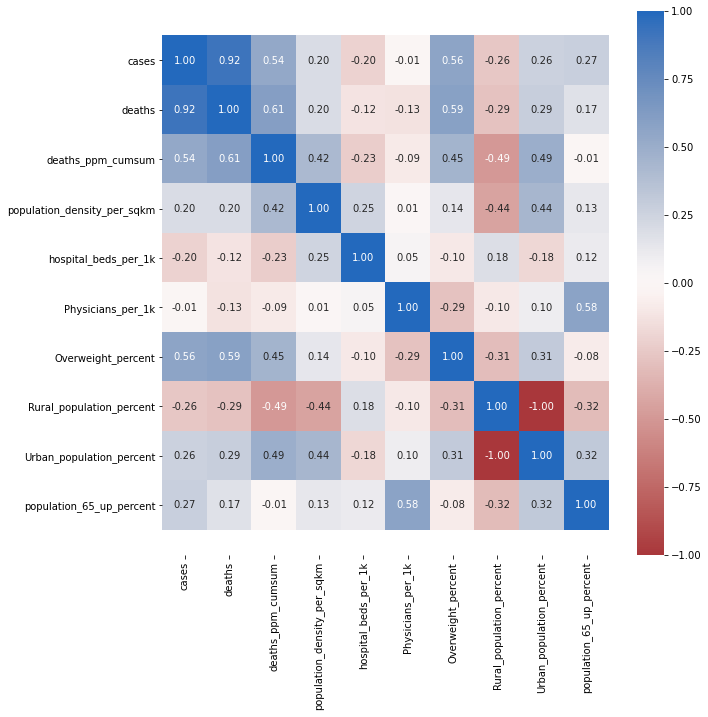

In [14]:
subset_list=['cases', 'deaths','deaths_ppm_cumsum', 'population_density_per_sqkm', 'hospital_beds_per_1k','Physicians_per_1k', 'Overweight_percent', 'Rural_population_percent','Urban_population_percent','population_65_up_percent']
#make correlation matrix
corrMatrix_full = df_covid_wb[subset_list].corr()

#plot heatmap of features correlated with gender
plt.figure(figsize = [10,10])

ht = sns.heatmap(corrMatrix_full, annot = True,cmap = 'vlag_r',fmt = '.2f',center = 0)
ht.set_ylim(len(corrMatrix_full)+0.5, -0.5)


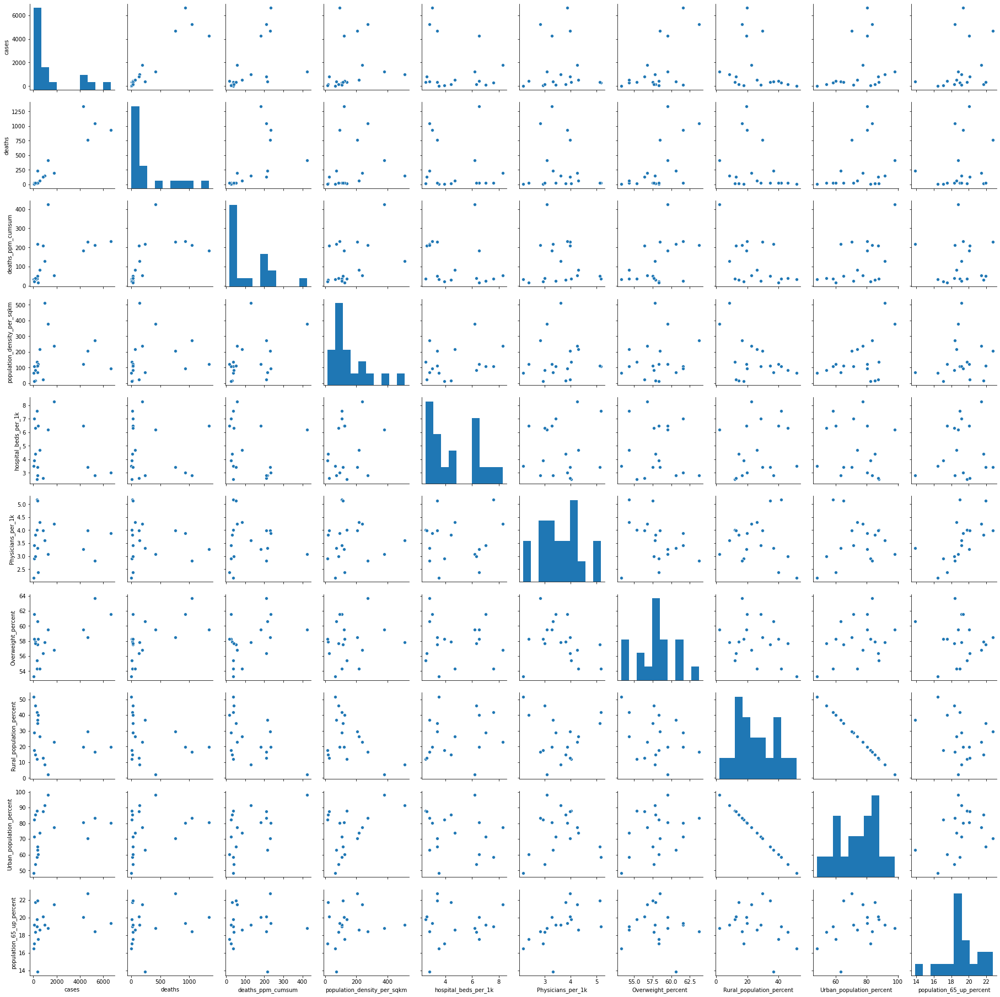

In [15]:
#deaths_million_cumsum
sns.pairplot(df_covid_wb.loc[:,subset_list])

In [16]:
#should add dropdown menu to change features

fig_EU_hosp = px.scatter(df_covid_wb, x="Urban_population_percent",y="hospital_beds_per_1k",
                 size="deaths_ppm_cumsum", color="deaths_ppm_cumsum",
                 hover_name="country",log_y=False, log_x=False,size_max=60,
                 title="Relationship between Hospital Beds, Urbanicity and Deaths per Million in Euopean Countries",
                 labels={"Overweight_percent":"Overweight Percent","hospital_beds_per_1k":"Hospital Beds per 1k population","Urban_population_percent":"Urban Population Percent", "deaths_ppm_cumsum":"Deaths per million", "continent":"Continent","country":"Country"})
fig_EU_hosp.show()

In [17]:
fig_EU_weight = px.scatter(df_covid_wb, y="Overweight_percent",x="Urban_population_percent",
                 size="deaths_ppm_cumsum", color="deaths_ppm_cumsum",
                 hover_name="country",log_y=False, log_x=False,size_max=60,
                 title="Relationship between Weight and Deaths per Million in European Countries",
                 labels={"Overweight_percent":"Overweight Percent","Urban_population_percent":"Urban Population Percent", "deaths_ppm_cumsum":"Deaths per million", "continent":"Continent","country":"Country"})
fig_EU_weight.show()

The above plots are interesting to me, because I wasent previously aware that Belgium had such a comparatively high rate of death, nor was I aware how urban Belgium is. 
The other part I found surprising despite being aware of it beforehand, was the much higher rate of deaths in sweden when compared to denmark finland and norway. This makes sense given that sweden did not go into lockdown, but I have never actually seen it visualised like this before.

I feel these visualisations could be useful in reinforcing existing narratives when communicating results either to the public or to goverment agencies. 


## Save Plots as HTML file

In [21]:
with open('plotly_corona_dynamic_graphs.html', 'w') as f:
    f.write(fig.to_html(include_plotlyjs='cdn'))
    f.write(fig_world.to_html(include_plotlyjs='cdn'))
    f.write(fig_EU_weight.to_html(include_plotlyjs='cdn'))
#with open('plotly_corona_world_bank_scatter_plots.html', 'w') as f:
#    f.write(fig_EU_hosp.to_html(include_plotlyjs='cdn'))
#    f.write(fig_EU_weight.to_html(include_plotlyjs='cdn'))
    
    